# Generate the Home Pointcloud

In [1]:
import json
import math
import os
from os import walk
import numpy as np
import numpy.linalg as LA
import scipy.io as sio
import copy
import time
import collections
import networkx as nx
from ast import literal_eval

import cv2
import png
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
from io import StringIO
from statistics import mean
from math import cos, sin, acos, atan2, pi

from utills import *
from baseline_utils import target_category_list, mapper_cat2index, TRAIN_WORLDS, TEST_WORLDS, SUPPORTED_ACTIONS, minus_theta_fn, cameraPose2currentPose, readDepthImage, project_pixels_to_world_coords, read_all_poses, read_cached_data, ActiveVisionDatasetEnv



# Read the path file

Please choose the target object.

In [2]:
paths = open('paths.json',)
data = json.load(paths)

print("Please choose the target object: tv, fridge, microwave, couch")
user_input = input("")

path2Obj = data['target_category_{}_in_current_world_Home_002_1'.format(user_input)]
print(path2Obj)

Please choose the target object: tv, fridge, microwave, couch
tv
['000210000220101', '000210000210101', '000210000330101', '000210001140101', '000210001020101', '000210001030101', '000210001020101', '000210005310101', '000210005190101', '000210005070101', '000210005190101', '000210005310101', '000210005320101', '000210004720101', '000210001150101', '000210001030101', '000210005320101', '000210005310101', '000210005190101', '000210005070101', '000210005080101', '000210005070101', '000210005080101', '000210005090101', '000210005080101', '000210005560101', '000210005800101', '000210005810101', '000210005800101', '000210005790101', '000210005910101', '000210006030101', '000210006040101', '000210005920101', '000210006280101', '000210005920101', '000210006280101', '000210006290101', '000210006280101', '000210006400101', '000210005920101', '000210005910101', '000210005790101', '000210005800101', '000210005920101', '000210006040101', '000210005080101', '000210005560101', '000210005550101', '00

## Pointclouds in Camera Coordinate System

This part generates point clouds in the camera coordinate system using RGB image and depth data.

Please, change the "dataPath."

    "dataPath" is a path to the dataset.
    "scene" is a home that you choose.
    "outFolder" is the output folder to save the point clouds.
    "imgPath" is a path to an RGB image.
    "depthPath" is a path to a depth image.
    "name" is for the output point cloud.
    "generatePcdinCameraCoordinat" is a function in utils, computes the image point clouds in camera coordinate. 
    

In [3]:
# for an imag

#path to AVD
dataPath = "../../Datasets/ActiveVisionDataset/"
#path to Home
scene = "Home_002_1"
#the output folder
outFolder = "wholeScenePCL/"+scene+"/camCoordinatPCL_{}".format(user_input)

if not os.path.exists(outFolder):
    os.makedirs(outFolder)

for i in literal_eval(path2Obj):
    
    #path to RGB image
    imgPath = dataPath+scene+"/jpg_rgb/"+"{}.jpg".format(i)
    #path to depth image
    depthPath = dataPath+scene+"/high_res_depth/"+"{}3.png".format(i[:-1])
    #A name
    name = "pcl_"+depthPath[-19:-4]
    
    #check utils file for the function
    generatePcdinCameraCoordinat(dataPath, scene, imgPath, depthPath, outFolder,name)
    

pcl_000210000220103.ply is saved.
pcl_000210000210103.ply is saved.
pcl_000210000330103.ply is saved.
pcl_000210001140103.ply is saved.
pcl_000210001020103.ply is saved.
pcl_000210001030103.ply is saved.
pcl_000210001020103.ply is saved.
pcl_000210005310103.ply is saved.
pcl_000210005190103.ply is saved.
pcl_000210005070103.ply is saved.
pcl_000210005190103.ply is saved.
pcl_000210005310103.ply is saved.
pcl_000210005320103.ply is saved.
pcl_000210004720103.ply is saved.
pcl_000210001150103.ply is saved.
pcl_000210001030103.ply is saved.
pcl_000210005320103.ply is saved.
pcl_000210005310103.ply is saved.
pcl_000210005190103.ply is saved.
pcl_000210005070103.ply is saved.
pcl_000210005080103.ply is saved.
pcl_000210005070103.ply is saved.
pcl_000210005080103.ply is saved.
pcl_000210005090103.ply is saved.
pcl_000210005080103.ply is saved.
pcl_000210005560103.ply is saved.
pcl_000210005800103.ply is saved.
pcl_000210005810103.ply is saved.
pcl_000210005800103.ply is saved.
pcl_0002100057

## Change the point clouds coordinate into a world coordinate.

Make sure that you have already defined "dataPath" and "scene" in the previous cell.

    "scene" is a home that you choose.
    "cameraCoordinatPclDir" path to save object coordinate point clouds (the output of the previous cell).
    "pcdOutFolder" is the output folder to save the point clouds.
    "depthPath" is a path to a depth image.
    "imgName" the name of the corresponding RGB image.
    "pcdPath" the name of the corresponding point cloud.
    "name" is for the output point cloud.
    "convertPcd2WorldCoordinat" is a function in utils, computes the image point clouds in world coordinate from the point cloud in object coordinate. All the inputs are described above.

In [4]:
# path to saved camera coordinate pcls (the output of previous cell).
cameraCoordinatPclDir = "wholeScenePCL/"+scene+"/camCoordinatPCL_{}".format(user_input)
# output folder
pcdOutFolder = "wholeScenePCL/"+scene+"/wrdCoordinatPCL_{}".format(user_input)

if not os.path.exists(pcdOutFolder):
    os.makedirs(pcdOutFolder)

for i in literal_eval(path2Obj): 
    
    #path to depth image
    depthPath = dataPath+scene+"/high_res_depth/"+"{}3.png".format(i[:-1])
    #RGB img name
    imgName = "{}1.jpg".format(depthPath[-19:-5])
    #path to obj coordinate pcl
    pcdPath = cameraCoordinatPclDir+"/pcl_{}.ply".format(depthPath[-19:-4])
    name = "pclW_"+depthPath[-19:-4]

    convertPcd2WorldCoordinat(pcdPath, dataPath, scene, imgName, pcdOutFolder, name) 


/home/negar/Documents/Projects/AVD_Visualization/utills.py:199: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  pcd = o3d.geometry.PointCloud.transform(pcd,Transformation_Matrix)


pclW_000210000220103.ply is saved.
pclW_000210000210103.ply is saved.
pclW_000210000330103.ply is saved.
pclW_000210001140103.ply is saved.
pclW_000210001020103.ply is saved.
pclW_000210001030103.ply is saved.
pclW_000210001020103.ply is saved.
pclW_000210005310103.ply is saved.
pclW_000210005190103.ply is saved.
pclW_000210005070103.ply is saved.
pclW_000210005190103.ply is saved.
pclW_000210005310103.ply is saved.
pclW_000210005320103.ply is saved.
pclW_000210004720103.ply is saved.
pclW_000210001150103.ply is saved.
pclW_000210001030103.ply is saved.
pclW_000210005320103.ply is saved.
pclW_000210005310103.ply is saved.
pclW_000210005190103.ply is saved.
pclW_000210005070103.ply is saved.
pclW_000210005080103.ply is saved.
pclW_000210005070103.ply is saved.
pclW_000210005080103.ply is saved.
pclW_000210005090103.ply is saved.
pclW_000210005080103.ply is saved.
pclW_000210005560103.ply is saved.
pclW_000210005800103.ply is saved.
pclW_000210005810103.ply is saved.
pclW_000210005800103

#  A single world coordinate point cloud from multi-view

In this part, we visualize the path to the object step by step. The whole path will be visualized at the end.
You can also see the point clouds step by step if you un comments this line :

    #o3d.visualization.draw_geometries([pcd]) 
    
AVD does not have the rotation and translation for some images.

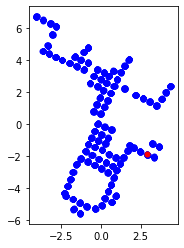

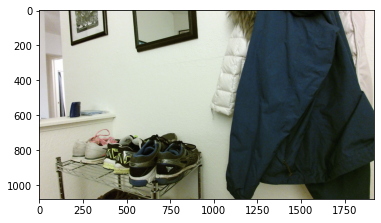

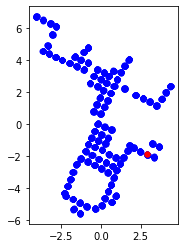

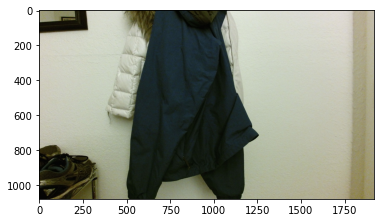

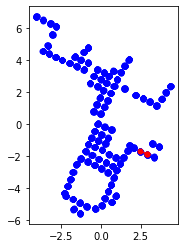

...

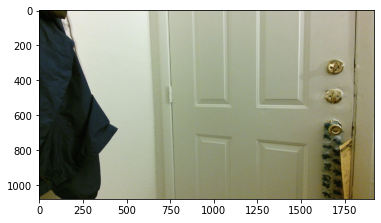

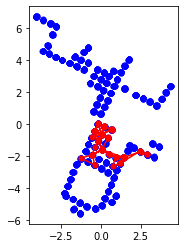

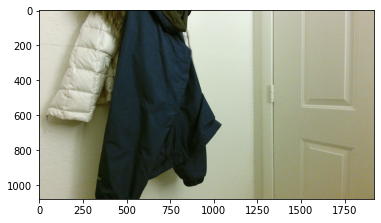

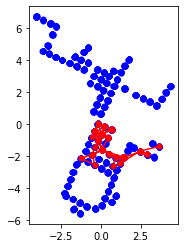

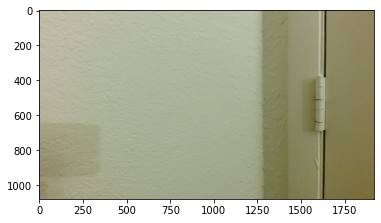

[Open3D WARNING] Read PLY failed: unable to open file: wholeScenePCL/Home_002_1/wrdCoordinatPCL_tv/pclW_000210000570103.ply


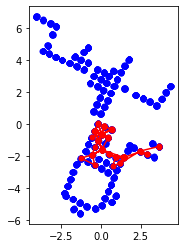

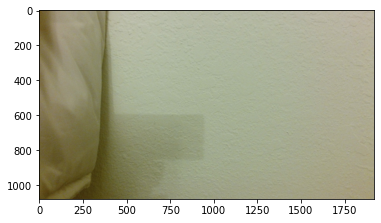

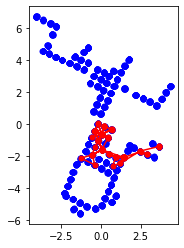

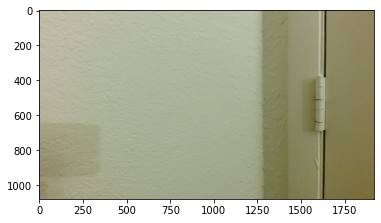

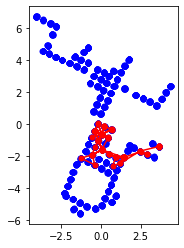

...

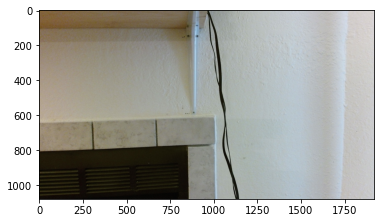

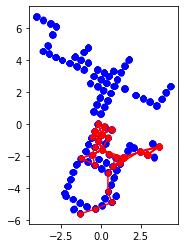

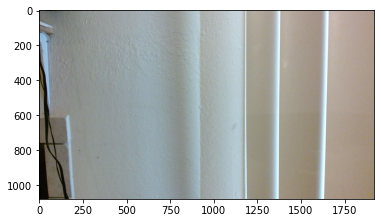

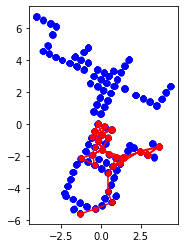

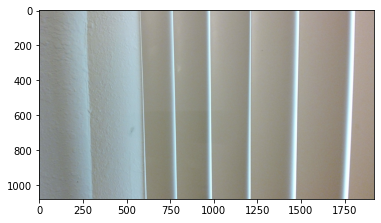

[Open3D WARNING] Read PLY failed: unable to open file: wholeScenePCL/Home_002_1/wrdCoordinatPCL_tv/pclW_000210002790103.ply


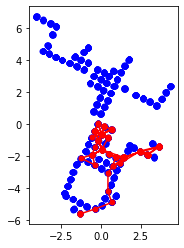

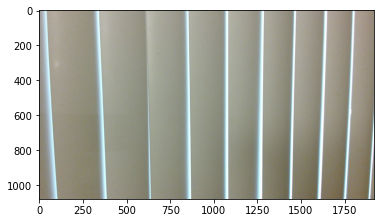

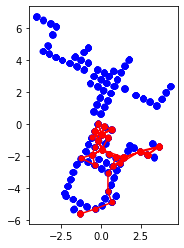

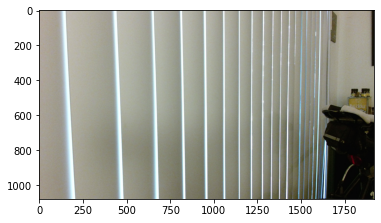

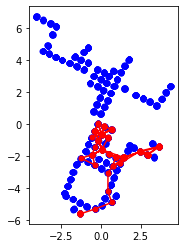

...

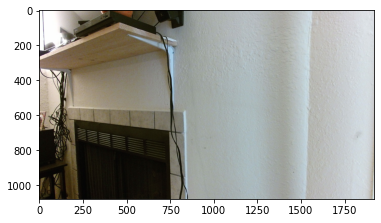

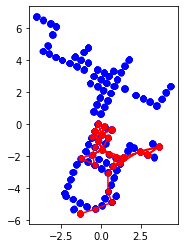

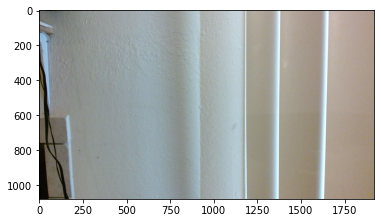

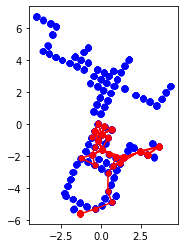

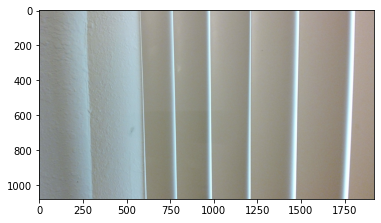

In [7]:
pcdOutFolder = "wholeScenePCL/"+scene+"/wrdCoordinatPCL_{}".format(user_input)
flag = 0
voxel_size = 0.02
newx = []
newz = []

for i in literal_eval(path2Obj): 
        
    img = i
        
    if(flag == 0):
        pcd = load_point_clouds(voxel_size,pcdOutFolder+"/pclW_{}3.ply".format(img[:-1]))
        pcd.transform([[1, 0, 0, 0], [0, 0, -1, 0], [0, -1, 0, 0], [0, 0, 0, 1]])

        flag = 1
    else : 
        pcdNew = load_point_clouds(voxel_size,pcdOutFolder+"/pclW_{}3.ply".format(img[:-1]))
        pcdNew.transform([[1, 0, 0, 0], [0, 0, -1, 0], [0, -1, 0, 0], [0, 0, 0, 1]])
        pcd = pcd + pcdNew
        
    all_poses = read_all_poses(dataPath, scene)
    plot1 = plt.figure(1)
    for key, val in all_poses.items():
        x, z, rot, scale = val
        plt.plot(x, z, color='blue', marker='o', markersize=5)
    newx.append(all_poses[img[:]][0])
    newz.append(all_poses[img[:]][1])
    plt.plot(newx, newz, color='red', marker='o', markersize=5)
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

    img2 = mpimg.imread(dataPath+scene+"/jpg_rgb/"+"{}.jpg".format(img))
    imgplot = plt.imshow(img2)
    plt.show()

        
    #o3d.visualization.draw_geometries([pcd]) 

if(flag != 0):
    
    name = "{}_{}_pcl".format(scene,user_input)           
    o3d.io.write_point_cloud("{}/{}.ply".format("wholeScenePCL/"+scene,name) , pcd)
    o3d.visualization.draw_geometries([pcd]) 


# Visualize the final point cloud here!

In [6]:
pcdShow = o3d.io.read_point_cloud("wholeScenePCL/"+scene+ "/{}.ply".format(name))
downPcd = pcdShow.voxel_down_sample(voxel_size=0.02)
o3d.visualization.draw_geometries([downPcd])

# The voxel grid visualization here!

The output also will be saved in "wholeScenePCL/scene" with the name "Home_002_1_tv_voxel.ply".

In [7]:
voxelGrid = o3d.geometry.VoxelGrid.create_from_point_cloud(pcdShow,voxel_size=0.02)
o3d.visualization.draw_geometries([voxelGrid])
o3d.io.write_voxel_grid("wholeScenePCL/"+scene+ "/{}_{}_voxel.ply".format(scene,user_input) , voxelGrid)

True

# The mesh of the point cloud.

We need to install trimesh.

The output also will saved in "wholeScenePCL/scene" with a name "Home_002_1_mesh.ply".

In [8]:
!pip install trimesh

In [9]:
import open3d as o3d
import trimesh
import numpy as np

pcd = o3d.io.read_point_cloud("wholeScenePCL/"+scene+"/{}_{}_pcl.ply".format(scene,user_input))
pcd.estimate_normals()

# estimate radius for rolling ball
distances = pcd.compute_nearest_neighbor_distance()
avg_dist = np.mean(distances)
radius = 1.5 * avg_dist   
mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_ball_pivoting(
           pcd,
           o3d.utility.DoubleVector([radius, radius * 2]))

# create the triangular mesh with the vertices and faces from open3d
triMesh = trimesh.Trimesh(np.asarray(mesh.vertices), np.asarray(mesh.triangles),
                          vertex_normals=np.asarray(mesh.vertex_normals))

trimesh.convex.is_convex(triMesh)

o3d.io.write_triangle_mesh("wholeScenePCL/"+scene+"/{}_{}_mesh.ply".format(scene,user_input),mesh)

True